# Linear Regression Project

Add all the libraries

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import statsmodels.api as sm
from datetime import datetime, timedelta

from sklearn.model_selection import train_test_split, cross_val_score 
from sklearn.linear_model import LinearRegression 
from sklearn.preprocessing import StandardScaler

from numpy import linspace
from scipy.stats.kde import gaussian_kde

# from bokeh.io import output_file, show
from bokeh.models import ColumnDataSource, FixedTicker, PrintfTickFormatter
from bokeh.plotting import figure
from bokeh.sampledata.perceptions import probly

import colorcet as cc

from bokeh.plotting import figure
from bokeh.io import output_file, show
from bokeh.io import output_notebook, push_notebook, show
import bokeh
bokeh.io.reset_output()
output_notebook()


Loading BokehJS ...

In [4]:
'''
Get the number of NAs for a DataFrame
'''

def print_NAs(dataframe):
    for column in dataframe:
        num_nas = dataframe[column].isna().sum()
        if num_nas > 0:
            print('Found {0} \t NAs in column \t{1} ({2:0.2f}% of the data)'.format(num_nas, column, 100.*num_nas/len(df)))

## Initial inspection

In [5]:
# Read in the csv file which contains data
df = pd.read_csv('kc_house_data.csv')

In [6]:
# Let's take a look at the first few columns
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,...,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,...,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503


In [7]:
# Change the date so it's numbers
df.dtypes

id                 int64
date              object
price            float64
bedrooms           int64
bathrooms        float64
sqft_living        int64
sqft_lot           int64
floors           float64
waterfront       float64
view             float64
condition          int64
grade              int64
sqft_above         int64
sqft_basement     object
yr_built           int64
yr_renovated     float64
zipcode            int64
lat              float64
long             float64
sqft_living15      int64
sqft_lot15         int64
dtype: object

Some interesting notes:
- sqft_basement is a string object
- data is a string object

## Cleaning data

In [8]:
print_NAs(df)

Found 2376 	 NAs in column 	waterfront (11.00% of the data)
Found 63 	 NAs in column 	view (0.29% of the data)
Found 3842 	 NAs in column 	yr_renovated (17.79% of the data)


Let's look at waterfront


In [9]:
scale = [[0, 'rgb(0,0,255)'], [1, 'rgb(255,0,0)']]

In [10]:
import plotly.plotly as py
import plotly.graph_objs as go

import plotly as py
import cufflinks as cf
from plotly.offline import download_plotlyjs,init_notebook_mode, plot, iplot
cf.go_offline()

mapbox_access_token = 'pk.eyJ1IjoiYW1hbnp1ciIsImEiOiJjanZjaGhtbzgxaWYyNDRtaml6czBubjFoIn0.99ACHwtMeYKsYQLf2jQ6kA'
data = [
    go.Scattermapbox(
        lat =df['lat'],
        
        lon=df['long'],
        text = df['waterfront'],
        mode='markers',
        marker=go.scattermapbox.Marker(
            size=6,
            colorscale = scale,
            cmin = 0,
            color = df['waterfront'],
            cmax = 1,
           
        ),
        
    )
]
layout = go.Layout(
    title = 'Waterfront Houses in King County',
    width=900,height=900,autosize=True,
    hovermode='closest',
    mapbox=go.layout.Mapbox(
        accesstoken=mapbox_access_token,
        bearing=0,
        center=go.layout.mapbox.Center(
            lat=47.5,
            lon=-122
        ),
        pitch=0,
        zoom=9
    ),
)

fig = go.Figure(data=data, layout=layout,)
iplot(fig, filename='King County Mapbox')

### We could fill the NA waterfront houses with NAs with the mean (0), but from inspecting the map we can find some houses that are on the waterfront that would be miss-classified. Instead we drop the column

In [11]:
# view added mode since it is less than 1% of data
view_mode = df['view'].mode()
print(view_mode[0])
df['view'].fillna(value=view_mode[0],inplace=True)

0.0


In [12]:
# year renovated is ~18% of the data, 
#Convert year renovated to renovated or not variable
df['is_renovated'] = df['yr_renovated'].apply(lambda x: 1 if x>0 else 0)

In [13]:
#sqft basement is a string and some values are missing '?'
df['sqft_basement'].head(7) 

0       0.0
1     400.0
2       0.0
3     910.0
4       0.0
5    1530.0
6         ?
Name: sqft_basement, dtype: object

In [14]:
# the basement sqft can be calculated as the difference 
# between the living area and the above area
df['sqft_basement'] = df['sqft_living'] - df['sqft_above']

In [15]:
# but since sqft_basement is dependent on two other variables, l
# let's convert it into a has basement or not
df['has_basement'] = df['sqft_basement'].apply(lambda x: 1 if x>0 else 0)


In [16]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,is_renovated,has_basement
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,...,0,1955,0.0,98178,47.5112,-122.257,1340,5650,0,0
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,400,1951,1991.0,98125,47.7210,-122.319,1690,7639,1,1
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,...,0,1933,NaN,98028,47.7379,-122.233,2720,8062,0,0
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,910,1965,0.0,98136,47.5208,-122.393,1360,5000,0,1
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,0,1987,0.0,98074,47.6168,-122.045,1800,7503,0,0


# Exploratory Data Analysis

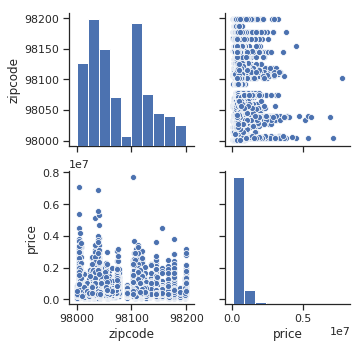

In [17]:
# Let's make a pairplot with seaborn to check the distribution
# and relationship between our dataset. 
sns.set(style="ticks", color_codes=True)
g = sns.pairplot(df[['zipcode', 'price']])

### Let's drop the zipcode

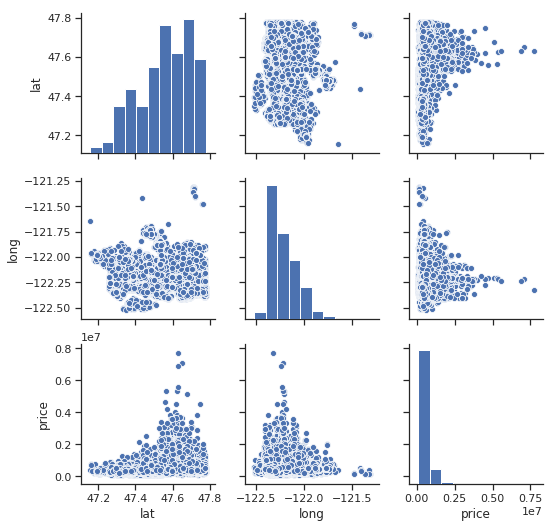

In [18]:
# Let's make a pairplot with seaborn to check the distribution
# and relationship between our dataset. 
sns.set(style="ticks", color_codes=True)
g = sns.pairplot(df[['lat', 'long', 'price']])

let's drop lat, long

Also let's drop ID

## Looking for outliers



There is a property with >30 bedrooms! but upon inspection it only has 1.75 bathrooms, and 1620 sq ft of living area, the 33 must be a typo. Remove

In [19]:
df.bedrooms.unique()

array([ 3,  2,  4,  5,  1,  6,  7,  8,  9, 11, 10, 33])

In [18]:
df[df.bedrooms>30]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,is_renovated,has_basement
15856,2402100895,6/25/2014,640000.0,33,1.75,1620,6000,1.0,0.0,0.0,...,580,1947,0.0,98103,47.6878,-122.331,1330,4700,0,1


In [20]:
df = df[df.bedrooms<30]

# Some questions

## What is the best month / day to sell ?

In [21]:
from datetime import datetime
df['date'] = df['date'].apply(lambda x: datetime.strptime(x,'%m/%d/%Y'))

In [22]:
df['year_bought'] = df['date'].apply(lambda x: x.year)
df['month_bought'] = df['date'].apply(lambda x: x.month)
df['dofweek_bought'] = df['date'].apply(lambda x: x.weekday())

In [23]:
sold_per_month = df.groupby('month_bought')['price'].count()
sm = pd.DataFrame(list(sold_per_month),columns=['Nbought'])#.iloc[0]

sold_per_week = df.groupby('dofweek_bought')['price'].count()
sw = pd.DataFrame(list(sold_per_week),columns=['Nbought'])

In [24]:
sm.index

RangeIndex(start=0, stop=12, step=1)

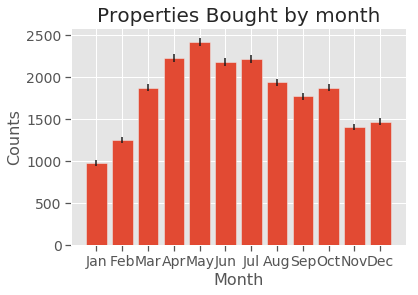

In [25]:

plt.style.use('ggplot')
month_names=['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
plt.bar(sm.index, sm.Nbought,yerr = np.sqrt(sm.Nbought)) 
plt.xticks(sm.index,month_names,fontsize=14);
plt.yticks(fontsize=14);
plt.title('Properties Bought by month',fontsize=20);
plt.xlabel('Month', fontsize=16)
plt.ylabel('Counts',fontsize=16);

In [26]:
day_names=['Mon','Tue', 'Wed', 'Thur','Fri','Sat','Sun']


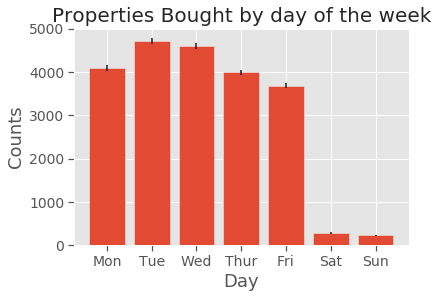

In [27]:
plt.bar(sw.index, sw.Nbought,yerr = np.sqrt(sw.Nbought)) 
plt.xticks(sw.index,day_names,fontsize=14);
plt.yticks(fontsize=14);
plt.title('Properties Bought by day of the week',fontsize=20);
plt.xlabel('Day', fontsize=18)
plt.ylabel('Counts',fontsize=18);

### Most houses are sold on Tuesdays! Who is buying on a weekend?

## Which are most/least expensive zipcodes

In [28]:
avg_price = (df.groupby('zipcode')['price'].mean())
avg_low = avg_price[:5]
avg_high = avg_price[:-5]

zp_price = pd.DataFrame(avg_price)
zp_price.head()
zp_hi = zp_price.nlargest(4,'price')

zp_lo = zp_price.nsmallest(4,'price')
zipcodes = list(zp_lo.index)
zipcodes += list(zp_hi.index)
five_codes = []
for zp in zipcodes:
    five_codes.append(str(zp))

In [29]:
zp_price.nlargest(4,'price')
print(zp_hi)
zipcodes

                price
zipcode              
98039    2.161300e+06
98004    1.356524e+06
98040    1.194874e+06
98112    1.096239e+06


[98002, 98168, 98032, 98001, 98039, 98004, 98040, 98112]

In [30]:
def ridge(category, data, scale=20):
    return list(zip([category]*len(data), scale*data))

# cats = list(df['zipcode'].unique().astype(str))
cats=five_codes

palette = [cc.rainbow[i*int(256/len(cats))] for i in range(len(cats))]

x = linspace(-10,110, 500)

source = ColumnDataSource(data=dict(x=x))

p = figure(y_range=cats, plot_width=500, plot_height=700, x_range=(0,100), toolbar_location=None)
    
for i, cat in enumerate(reversed(cats)):
    pdf = gaussian_kde((df[df['zipcode']==int(cat)]['price']-df['price'].min())/(df['price'].max()-df['price'].min())*100.0)
    if i<4:
        scale = 8
    else:
        scale = 1
    y = ridge(cat, pdf(x),scale)
    source.add(y, cat)
    p.patch('x', cat, color=palette[i], alpha=0.8, line_color="black", source=source)
    
        
p.outline_line_color = None
p.background_fill_color = "#efefef"

p.xaxis.ticker = FixedTicker(ticks=list(range(0, 101, 10)))
# p.xaxis.formatter = PrintfTickFormatter(format="%d%%")

p.ygrid.grid_line_color = None
p.xgrid.grid_line_color = "#dddddd"
p.xgrid.ticker = p.xaxis[0].ticker

p.axis.minor_tick_line_color = None
p.axis.major_tick_line_color = None
p.axis.axis_line_color = None
p.xaxis.axis_label = '(Price - Min)/(Max - Min) (x100)'
p.yaxis.axis_label = 'ZipCodes'
p.y_range.range_padding = 0.12

show(p,notebook_handle=True);


## New/Renovated Housing vs. Price

Can how recently a house was built or renovated—it's "newness"—affect it's price per square foot? First, let's define some new columns.

In [31]:
df["blt_or_renov"] = df["yr_renovated"]

In [32]:
df.loc[df[df["blt_or_renov"] == 0].index, "blt_or_renov"] = df[df["blt_or_renov"] ==0]["yr_built"]
df["blt_or_renov"].fillna(value=df["yr_built"], inplace=True)


In [33]:
df["price_per_sqft"] = df["price"]/df["sqft_living"]

In [34]:
from statsmodels.formula.api import ols
model = ols(formula="blt_or_renov~price_per_sqft", data=df).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           blt_or_renov   R-squared:                       0.065
Model:                            OLS   Adj. R-squared:                  0.065
Method:                 Least Squares   F-statistic:                     1505.
Date:                Tue, 07 May 2019   Prob (F-statistic):          2.71e-318
Time:                        17:20:44   Log-Likelihood:            -1.0259e+05
No. Observations:               21596   AIC:                         2.052e+05
Df Residuals:                   21594   BIC:                         2.052e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept       1990.6873      0.495   4018.364      0.000    1989.716    1991.658
price_per_sqft    -0.0672      0.002    -38.793      0.000      -0.071      -0.064
==============================================================================
Omnibus:                      878.930   Durbin-Watson:                   1.626
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              687.805
Skew:                          -0.352   Prob(JB):                    4.42e-150
Kurtosis:                       2.481   Cond. No.                         744.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

/Users/angelmanzur/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



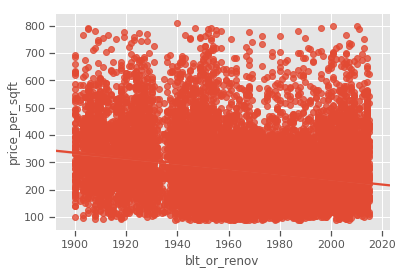

In [35]:
sns.regplot("blt_or_renov","price_per_sqft", data=df)

Can't see any trends, but maybe there are distinctions on the zipcode level

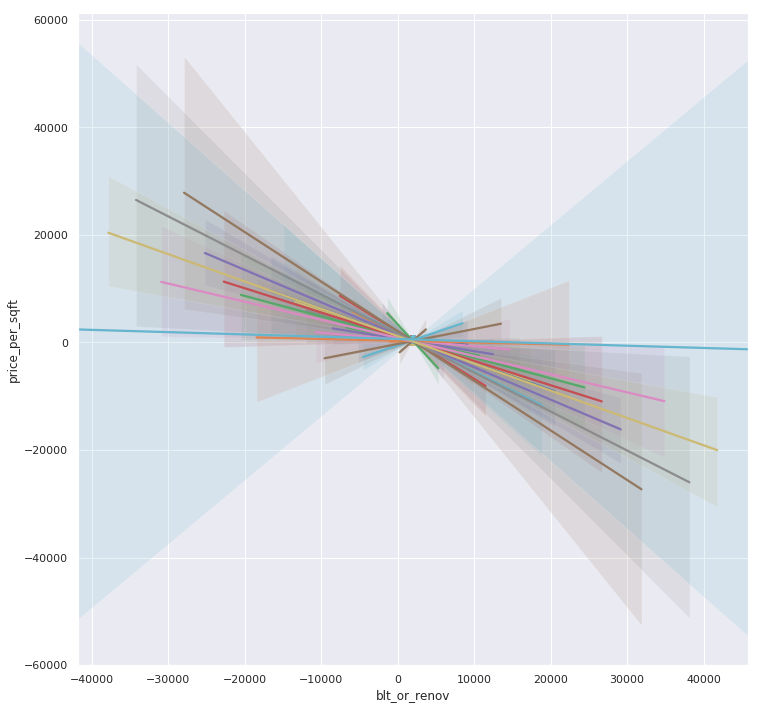

In [36]:
rsquared = {}
slopes = {}

sns.set(rc={'figure.figsize':(12,12)})
for zipcode in df["zipcode"].unique():
    df_filter = df[df["zipcode"] == zipcode]
    model = ols(formula="blt_or_renov~price_per_sqft", data=df_filter).fit()
    sns.regplot("blt_or_renov","price_per_sqft", data=df_filter, label=zipcode)
    rsquared[zipcode] = model.rsquared
    slopes[zipcode] = model.params[1]


A new style of graph still to be named. It effectively does something similar to a pairwise plot, layering linear regression plots on top of each othr

Strangely, there's a negative slope for a majority of zipcodes. That is, recently new/renovated housing is cheaper per square foot in many zip codes than older housing (built or renovated further in the past).

Let's see what the largest correlations are.

In [37]:
print("Top 5 locations where new/renovated housing is cheaper than older. Near Boeing Field airport, Duvall, Renton, Kent, Delridge Except for Delridge, they are all outside downtown Seattle, with Duvall being rural.")
sorted(slopes.items(),key=lambda x:x[1])[0:5]


Top 5 locations where new/renovated housing is cheaper than older. Near Boeing Field airport, Duvall, Renton, Kent, Delridge Except for Delridge, they are all outside downtown Seattle, with Duvall being rural.


[(98108, -0.14289468465125277),
 (98019, -0.1409173956697911),
 (98055, -0.13323386095987377),
 (98042, -0.13208572965631604),
 (98106, -0.12894118515667763)]

In [38]:
print("The locations where new/renovated housing tends to be more expensive than older. Redmond, WA (home of Microsoft), Bellevue, Washington Park, etc..")
pos_slopes = [x[0] for x in slopes.items() if x[1] > 0]
print(pos_slopes)

The locations where new/renovated housing tends to be more expensive than older. Redmond, WA (home of Microsoft), Bellevue, Washington Park, etc..
[98053, 98007, 98112, 98027, 98166, 98070, 98008, 98144, 98034, 98102, 98029]


Taking a look at the relationship for the zipcode with the largest correlation - 98019.


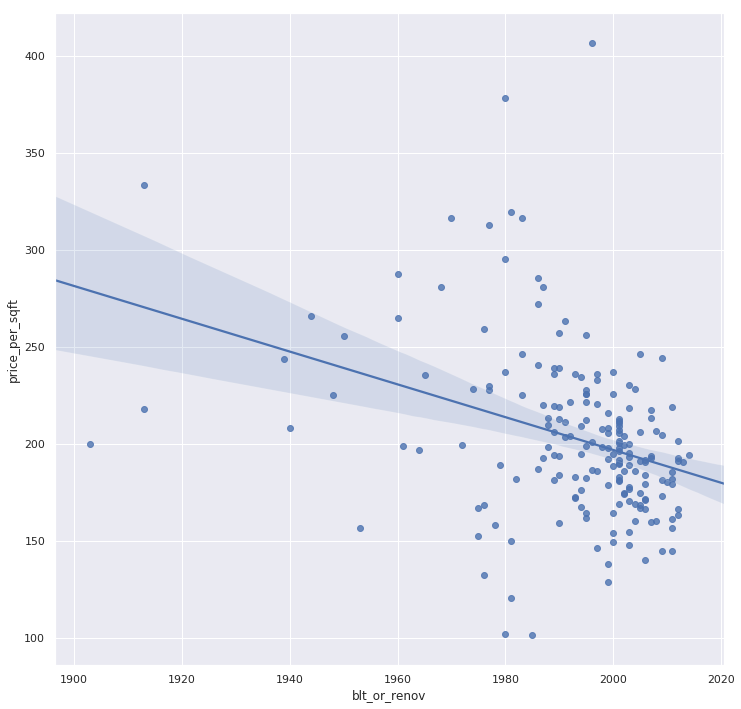

In [39]:
print("Taking a look at the relationship for the zipcode with the largest correlation - 98019.")
sns.regplot("blt_or_renov","price_per_sqft", data=df[df["zipcode"] == 98019], label=zipcode)

Maybe we can ignore pre-1980 housing as there's not much and they appear to be outliers


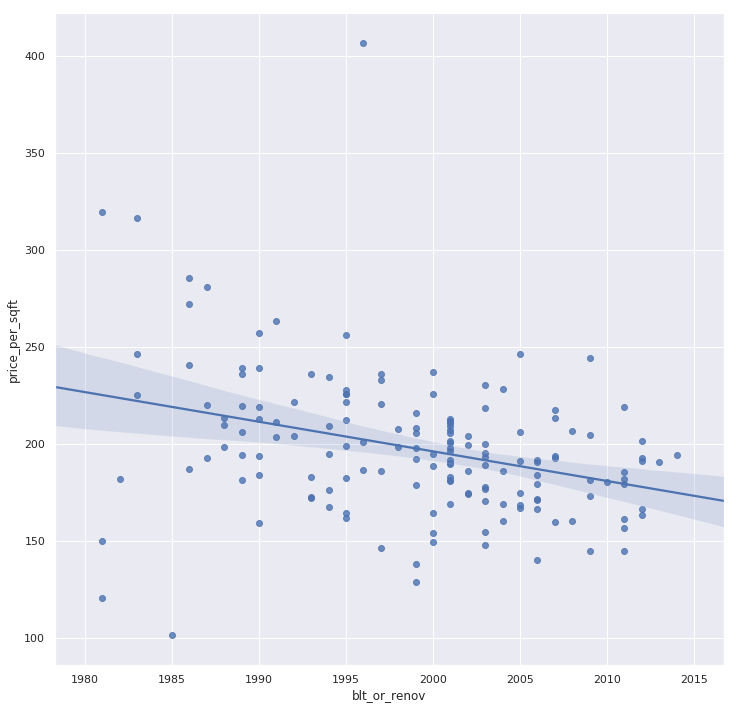

In [40]:
print("Maybe we can ignore pre-1980 housing as there's not much and they appear to be outliers")
sns.regplot("blt_or_renov","price_per_sqft", data=df[(df["zipcode"] == 98019) & (df["blt_or_renov"] >1980)], label=zipcode)

In [41]:
print("Modelling on the year and zipcode subset")
df_98019 = df[(df["zipcode"] == 98019) & (df["blt_or_renov"] >1980)]
model = ols(formula="blt_or_renov~price_per_sqft", data=df_98019).fit()
model.summary()

Modelling on the year and zipcode subset


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           blt_or_renov   R-squared:                       0.108
Model:                            OLS   Adj. R-squared:                  0.102
Method:                 Least Squares   F-statistic:                     18.84
Date:                Tue, 07 May 2019   Prob (F-statistic):           2.55e-05
Time:                        17:21:03   Log-Likelihood:                -542.94
No. Observations:                 158   AIC:                             1090.
Df Residuals:                     156   BIC:                             1096.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept       2012.8423      3.269    615.824      0.000    2006.386    2019.299
price_per_sqft    -0.0705      0.016     -4.340      0.000      -0.103      -0.038
==============================================================================
Omnibus:                        4.627   Durbin-Watson:                   1.655
Prob(Omnibus):                  0.099   Jarque-Bera (JB):                4.410
Skew:                          -0.408   Prob(JB):                        0.110
Kurtosis:                       3.052   Cond. No.                     1.09e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.09e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Again, not a great R2, but decent confidence interval. While this model may not predict, maybe we can say it is trending downward with a QQ plot and confidence interval

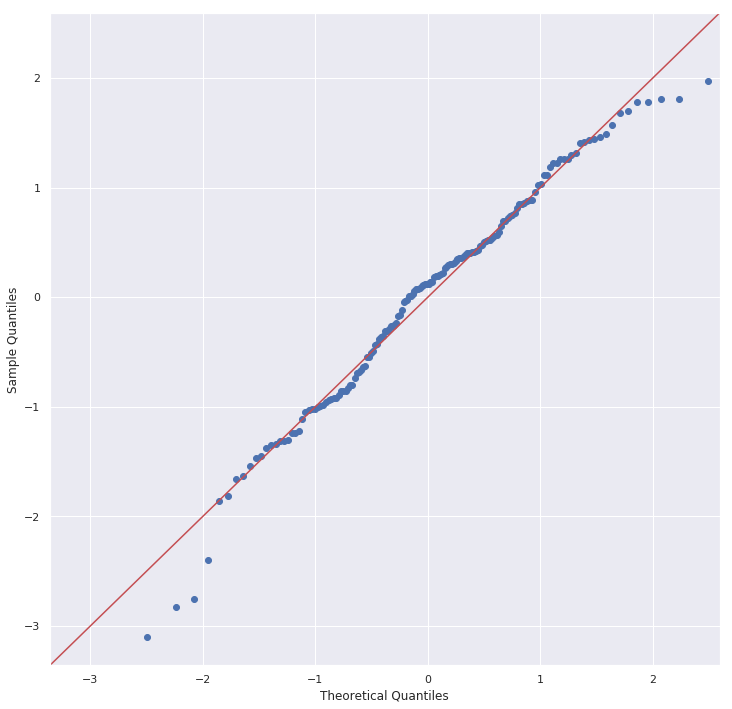

In [42]:
model.conf_int(.01)
import statsmodels.api as sm
import scipy.stats as stats
fig = sm.graphics.qqplot(model.resid, dist=stats.norm, line='45', fit=True)


# Now back to the analysis on the whole data set

In [42]:
#before we do a linear regeression lets drop some columns

In [53]:
columns_to_drop = ['id', 'zipcode','lat','long','month_bought', 'dofweek_bought', 'waterfront','date']
columns_to_drop = [ 'yr_renovated','sqft_basement']
columns_to_drop = [ 'view']
columns_to_drop = [ 'sqft_lot15', 'sqft_living15']
# columns_to_drop = ['blt_or_renov','price_per_sqft']

In [54]:
df.drop(columns_to_drop, axis=1, inplace=True)

In [55]:
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,yr_built,is_renovated,has_basement,year_bought
0,221900.0,3,1.00,1180,5650,1.0,3,7,1180,1955,0,0,2014
1,538000.0,3,2.25,2570,7242,2.0,3,7,2170,1951,1,1,2014
2,180000.0,2,1.00,770,10000,1.0,3,6,770,1933,0,0,2015
3,604000.0,4,3.00,1960,5000,1.0,5,7,1050,1965,0,1,2014
4,510000.0,3,2.00,1680,8080,1.0,3,8,1680,1987,0,0,2015


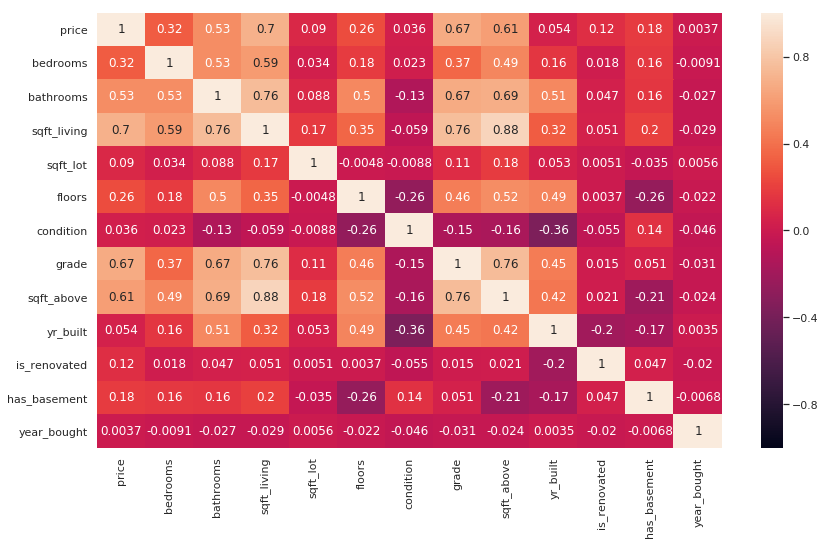

In [56]:
# Let's look at correlations
fig = plt.figure(figsize=(14, 8))
sns.heatmap(df.corr(), annot=True, vmin=-1, vmax=1)

In [57]:
cat_columns = []
for cols in df.columns:
    if df[cols].nunique()<50:
        cat_columns.append(cols)
        print('Category: {1} \t has {0} Unique values '.format(df[cols].nunique(), cols))
        print('\t\t ',df[cols].unique())
ncat_variables = len(cat_columns)

Category: bedrooms 	 has 11 Unique values 
		  [ 3  2  4  5  1  6  7  8  9 11 10]
Category: bathrooms 	 has 29 Unique values 
		  [1.   2.25 3.   2.   4.5  1.5  2.5  1.75 2.75 3.25 4.   3.5  0.75 4.75
 5.   4.25 3.75 1.25 5.25 6.   0.5  5.5  6.75 5.75 8.   7.5  7.75 6.25
 6.5 ]
Category: floors 	 has 6 Unique values 
		  [1.  2.  1.5 3.  2.5 3.5]
Category: condition 	 has 5 Unique values 
		  [3 5 4 1 2]
Category: grade 	 has 11 Unique values 
		  [ 7  6  8 11  9  5 10 12  4  3 13]
Category: is_renovated 	 has 2 Unique values 
		  [0 1]
Category: has_basement 	 has 2 Unique values 
		  [0 1]
Category: year_bought 	 has 2 Unique values 
		  [2014 2015]


In [58]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21596 entries, 0 to 21596
Data columns (total 13 columns):
price           21596 non-null float64
bedrooms        21596 non-null int64
bathrooms       21596 non-null float64
sqft_living     21596 non-null int64
sqft_lot        21596 non-null int64
floors          21596 non-null float64
condition       21596 non-null int64
grade           21596 non-null int64
sqft_above      21596 non-null int64
yr_built        21596 non-null int64
is_renovated    21596 non-null int64
has_basement    21596 non-null int64
year_bought     21596 non-null int64
dtypes: float64(3), int64(10)
memory usage: 2.9 MB


In [59]:
df.to_csv('king_data_clean_before_norm.csv')

 ## Let standarize the data

In [60]:
b = df['sqft_living']
df['sqft_living'] = (b-min(b))/(max(b)-min(b))

b = df['sqft_above']
df['sqft_above'] = (b-min(b))/(max(b)-min(b))

b = df['sqft_lot']
df['sqft_lot'] = (b-min(b))/(max(b)-min(b))

b = df['year_bought']
df['year_bought'] = (b-min(b))/(max(b)-min(b))

b = df['yr_built']
df['yr_built'] = (b-min(b))/(max(b)-min(b))

# standardization
b = df['price']
y = np.log(b)
# price_mean = b.mean()
# price_std = b.std()
# y = (b-price_mean)/(price_std)


In [61]:
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,yr_built,is_renovated,has_basement,year_bought
0,221900.0,3,1.00,0.061503,0.003108,1.0,3,7,0.089602,0.478261,0,0,0.0
1,538000.0,3,2.25,0.167046,0.004072,2.0,3,7,0.199115,0.443478,1,1,0.0
2,180000.0,2,1.00,0.030372,0.005743,1.0,3,6,0.044248,0.286957,0,0,1.0
3,604000.0,4,3.00,0.120729,0.002714,1.0,5,7,0.075221,0.565217,0,1,0.0
4,510000.0,3,2.00,0.099468,0.004579,1.0,3,8,0.144912,0.756522,0,0,1.0


## Let's split the data into train and test

In [105]:
# y = df['price']
X = df.drop(columns=['price'])

In [63]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20)
print('Train length ',len(X_train), len(y_train))
print('Test length ',len(X_test), len(y_test))

Train length  17276 17276
Test length  4320 4320


## Doing a k-fold on the data

In [76]:
# linreg = LinearRegression()

In [64]:
from sklearn.metrics import mean_squared_error
from sklearn import linear_model


In [65]:
linreg = linear_model.RidgeCV(alphas=[0.001,0.1, 1., 10], cv=5, fit_intercept=True, scoring=None)
linreg.fit(X_train, y_train)
y_hat_train = linreg.predict(X_train)


In [66]:
y_hat_test = linreg.predict(X_test)

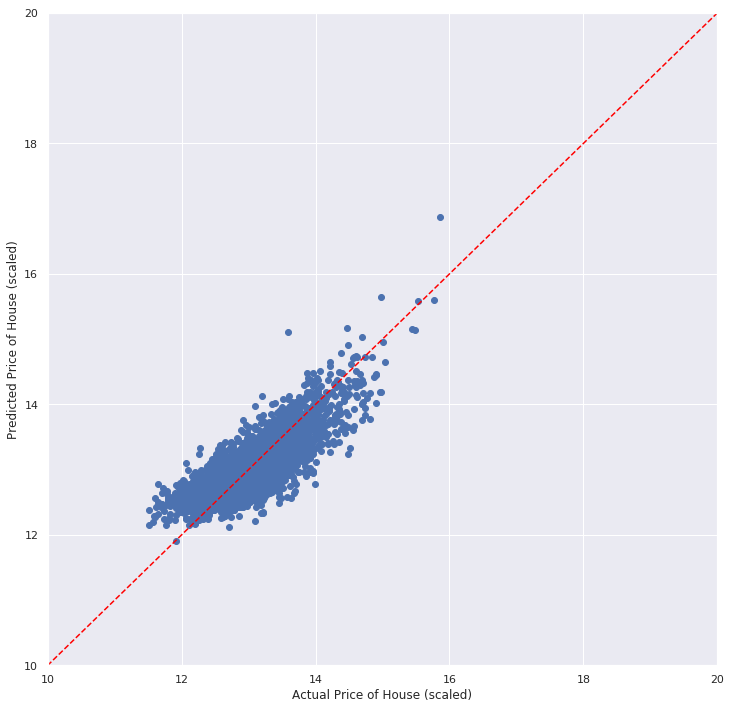

In [67]:
plt.scatter(y_test, linreg.predict(X_test));
plt.plot([-5, 30], [-5, 30], c='red', linestyle='--');

plt.xlim([10,20]);
plt.ylim([10,20]);
plt.xlabel('Actual Price of House (scaled)');
plt.ylabel('Predicted Price of House (scaled)');

In [69]:
def get_price(scaled_price):
    # y = (b-np.mean(b))/(np.sqrt(np.var(b)))
    # (y * np.sqrt(np.var(b))) + np.mean(b) --> b
    
#     price_mean = np.mean(b)
#     price_var = np.var(b)
#     y = (b-price_mean)/(np.sqrt(price_var))
    return  np.exp(scaled_price)
   

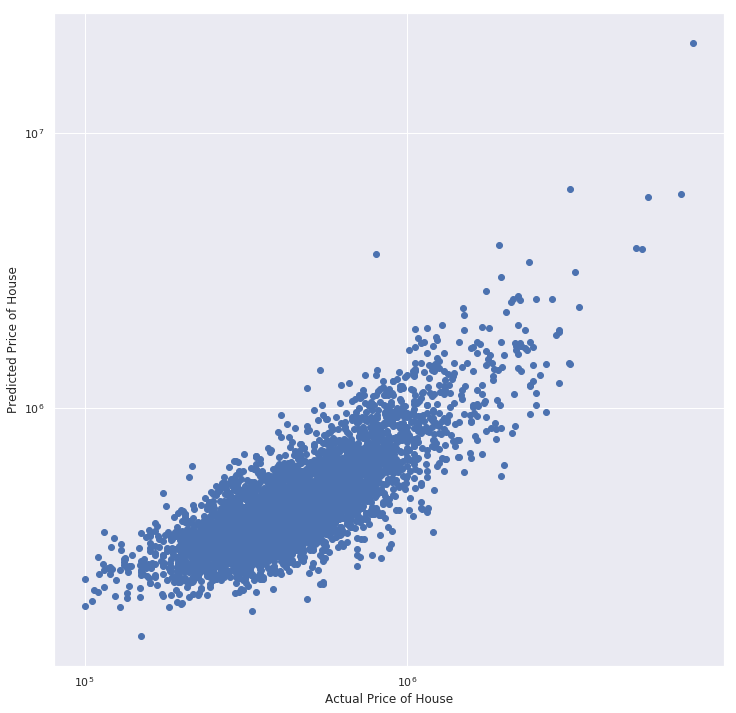

In [70]:
ax = plt.gca()
plt.scatter(list(map(get_price, y_test)), list(map(get_price, linreg.predict(X_test))))
# plt.plot([-5, 10], [-5, 10], c='red', linestyle='--')

# plt.xlim([-3.5,5])
# plt.ylim([-3.5,5e7])
plt.xlabel('Actual Price of House')
plt.ylabel('Predicted Price of House')
ax.set_xscale('log')
ax.set_yscale('log')

In [71]:
from sklearn.metrics import mean_squared_error
train_mse = mean_squared_error(y_train, y_hat_train)
test_mse = mean_squared_error(y_test, y_hat_test)
print('Train Mean Squarred Error:', train_mse)
print('Test Mean Squarred Error:', test_mse)

Train Mean Squarred Error: 0.0989288192466139
Test Mean Squarred Error: 0.09977716964738713


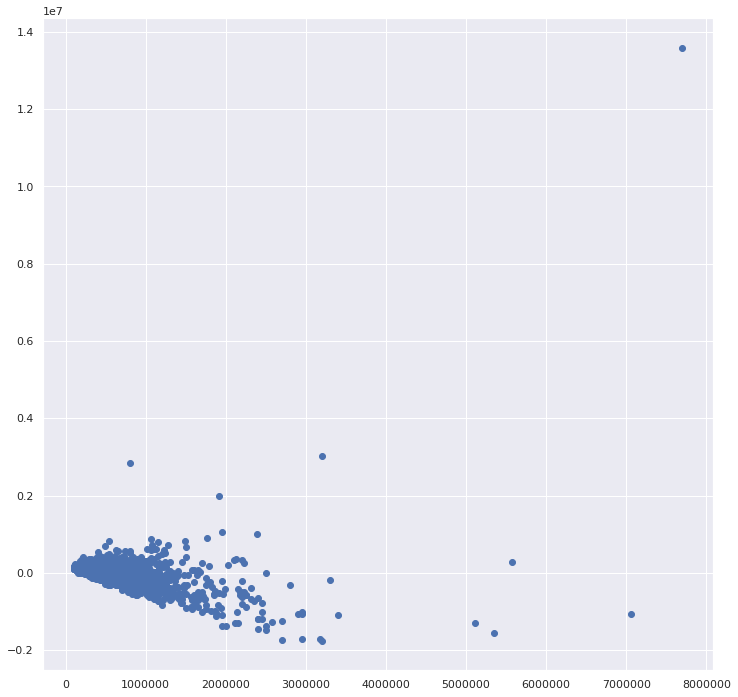

In [72]:
plt.scatter(get_price(y_test), get_price(y_hat_test)- get_price(y_test))

In [73]:
price_diff =  (get_price(y_hat_test)- get_price(y_test))/get_price(y_test)
price_diff.mean()*100

3.615127379495684

In [74]:
y_test.iloc[0]

12.487485104968359

In [88]:
X_test.iloc[0]

bedrooms         4.000000
bathrooms        3.500000
sqft_living      0.264996
sqft_lot         0.010791
floors           2.000000
condition        3.000000
grade           10.000000
sqft_above       0.304204
yr_built         0.834783
is_renovated     0.000000
has_basement     1.000000
year_bought      0.000000
Name: 13450, dtype: float64

In [75]:
linreg.coef_
for i,coef in enumerate(linreg.coef_):
    print('Var: ', X_train.columns[i], ' Coeff:' , coef)

Var:  bedrooms  Coeff: -0.03548469323106748
Var:  bathrooms  Coeff: 0.07363704408010528
Var:  sqft_living  Coeff: 1.8575430855094945
Var:  sqft_lot  Coeff: -0.08591995152180479
Var:  floors  Coeff: 0.10925288060081612
Var:  condition  Coeff: 0.04767787730038216
Var:  grade  Coeff: 0.22836545420812168
Var:  sqft_above  Coeff: 0.3662046591173044
Var:  yr_built  Coeff: -0.6368821538969558
Var:  is_renovated  Coeff: 0.055482703504868135
Var:  has_basement  Coeff: 0.11725248996713099
Var:  year_bought  Coeff: 0.038122682736470424


In [90]:
get_price(y_test.iloc[0])

840000.0000000005

In [91]:
(1273372 - 1199999)/get_price(y_test.iloc[0])

0.08734880952380948

In [92]:
import pandas as pd
dfo = pd.read_csv('kc_house_data.csv')

In [ ]:
# plt.scatter(dfo['yr_built'],dfo['sqft_living'])
# plt.ba.'r.''( dfo['yr_built'],dfo['sqft_living'])
# plt.bar()

<BarContainer object of 21597 artists>

### We got a model!! Let's inspect if we need all the variables

In [76]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

# linreg = LinearRegression()
selector = RFE(linreg, n_features_to_select = 5)
selector = selector.fit(X_train, y_train)


In [79]:
npred_arr = []
rms_train = []
rms_test=[]
top_predictors = []
for npreds in range(1,len(X_train.columns)):

    selector = RFE(linreg, n_features_to_select = npreds)
    selector = selector.fit(X_train, y_train)
    features_bool = np.array(selector.support_)
    features = np.array(X_train.columns)
    top = features[features_bool]
#     print(top)
#     linreg.fit(X_train, y_train)
    y_hat_train = selector.predict(X_train)
    y_hat_test = selector.predict(X_test)
    
    top_predictors.append(top)
    npred_arr.append(npreds)
    train_mse = mean_squared_error(y_train, y_hat_train)
    test_mse = mean_squared_error(y_test, y_hat_test)
    rms_train.append(train_mse)
    rms_test.append(test_mse)

   

In [ ]:
linreg

Text(0, 0.5, 'RMSE')

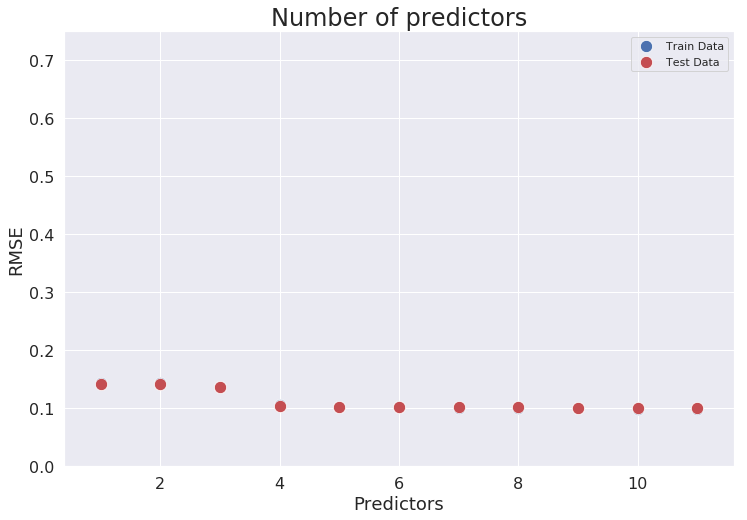

In [80]:
fig = plt.figure(figsize=(12,8))
sns.scatterplot(npred_arr, rms_train,label='Train Data',s=150,color='b')
sns.scatterplot(npred_arr, rms_test,label='Test Data',s=150,color='r')
plt.xlabel('Predictors',fontsize=18)
plt.title('Number of predictors',fontsize=24)

# plt.xticks(npred_arr,X_train.columns,rotation='vertical',fontsize=16)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.ylim(0.0, 0.75)
plt.ylabel('RMSE', fontsize=18)

In [109]:
targets =top_predictors[3]
print(targets)

['sqft_living' 'grade' 'sqft_above' 'yr_built']


In [110]:
X = X[targets]


In [97]:
y.shape

(21596,)

In [111]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20)
print('Train length ',len(X_train), len(y_train))
print('Test length ',len(X_test), len(y_test))

Train length  17276 17276
Test length  4320 4320


In [112]:
linreg = linear_model.RidgeCV(alphas=[0.001,0.1, 1., 10], cv=5, fit_intercept=True, scoring=None)
linreg.fit(X_train, y_train)
y_hat_train = linreg.predict(X_train)

In [113]:
y_hat_test = linreg.predict(X_test)

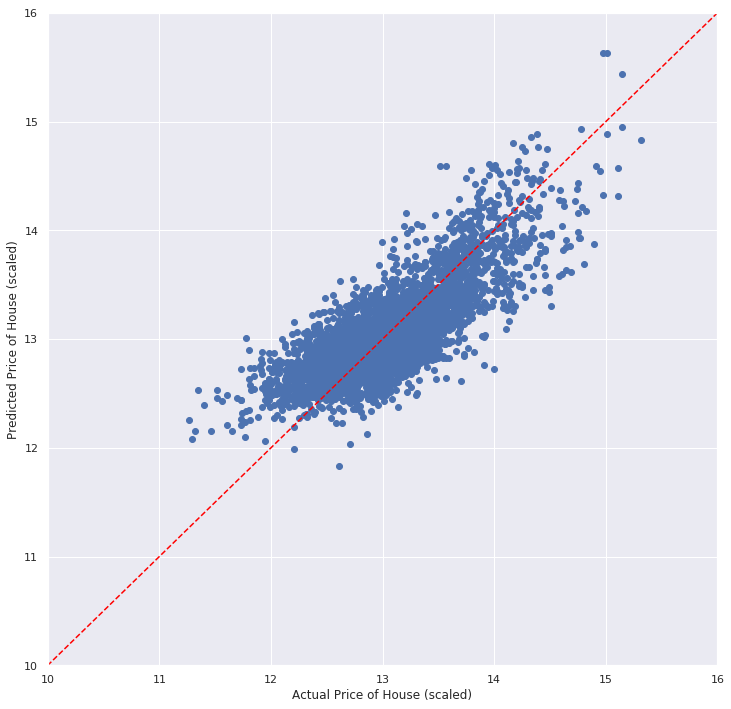

In [115]:
plt.scatter(y_test, linreg.predict(X_test));
plt.plot([-5, 30], [-5, 30], c='red', linestyle='--');

plt.xlim([10,16]);
plt.ylim([10,16]);
plt.xlabel('Actual Price of House (scaled)');
plt.ylabel('Predicted Price of House (scaled)');

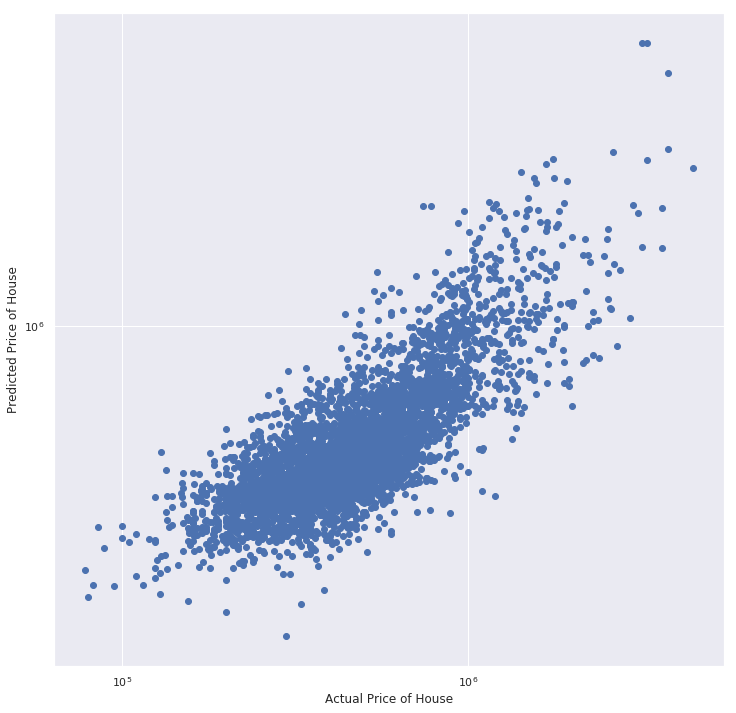

In [116]:
ax = plt.gca()
plt.scatter(list(map(get_price, y_test)), list(map(get_price, linreg.predict(X_test))))
# plt.plot([-5, 10], [-5, 10], c='red', linestyle='--')

# plt.xlim([-3.5,5])
# plt.ylim([-3.5,5e7])
plt.xlabel('Actual Price of House')
plt.ylabel('Predicted Price of House')
ax.set_xscale('log')
ax.set_yscale('log')

In [117]:
linreg.coef_
for i,coef in enumerate(linreg.coef_):
    print('Var: ', X_train.columns[i], ' Coeff:' , coef)

Var:  sqft_living  Coeff: 3.1294807897151373
Var:  grade  Coeff: 0.25342895301756496
Var:  sqft_above  Coeff: -0.39476628735394687
Var:  yr_built  Coeff: -0.5727090719825997
